In [1]:
from noaa_ftp import NOAA
import pandas as pd
import numpy as np
from datetime import datetime, date
import seaborn as sns
import matplotlib.pyplot as plt

In [8]:
noaa_dir = NOAA("ftp.ncdc.noaa.gov", 'pub/data/ghcn/daily/by_station').dir()
noaa_dir

-rw-rw-r--   1 ftp      ftp          3943 Apr 25 14:44 ACW00011604.csv.gz
-rw-rw-r--   1 ftp      ftp         39685 Apr 25 14:27 ACW00011647.csv.gz
-rw-rw-r--   1 ftp      ftp        245363 Apr 25 14:31 AE000041196.csv.gz
-rw-rw-r--   1 ftp      ftp        189452 Apr 25 14:03 AEM00041194.csv.gz
-rw-rw-r--   1 ftp      ftp        173327 Apr 25 14:27 AEM00041217.csv.gz
-rw-rw-r--   1 ftp      ftp        109313 Apr 25 14:24 AEM00041218.csv.gz
-rw-rw-r--   1 ftp      ftp         30288 Apr 25 14:39 AF000040930.csv.gz
-rw-rw-r--   1 ftp      ftp         59939 Apr 25 14:20 AFM00040938.csv.gz
-rw-rw-r--   1 ftp      ftp         87622 Apr 25 14:06 AFM00040948.csv.gz
-rw-rw-r--   1 ftp      ftp         67794 Apr 25 14:06 AFM00040990.csv.gz
-rw-rw-r--   1 ftp      ftp        452496 Apr 25 14:46 AG000060390.csv.gz
-rw-rw-r--   1 ftp      ftp        496103 Apr 25 14:40 AG000060590.csv.gz
-rw-rw-r--   1 ftp      ftp        349386 Apr 25 14:36 AG000060611.csv.gz
-rw-rw-r--   1 ftp      ftp        345

In [9]:
list = ['ACW00011604', 'ACW00011647']
for station in list:
    noaa = NOAA("ftp.ncdc.noaa.gov", 'pub/data/ghcn/daily/by_station').download(f'{station}.csv.gz')

Downloading:   0% [                                  ] ETA:  --:--:--   0.0 s/B
Downloading: 100% [################################] ETA:  00:00:00   4.2 KiB/s
Downloading:   0% [                                  ] ETA:  --:--:--   0.0 s/B
Downloading:  20% [######                          ] ETA:   0:00:03   8.6 KiB/s
Downloading:  52% [################                ] ETA:   0:00:01  17.2 KiB/s


In [2]:
"""
PRCP = Precipitation (tenths of mm)
SNOW = Snowfall (mm)
SNWD = Snow depth (mm)
TMAX = Maximum temperature (tenths of degrees C)
TMIN = Minimum temperature (tenths of degrees C)

"""
dateparse = lambda x: datetime.strptime(x, '%Y%m%d')
col_names = ['ID', 'Date', 'Variable', 'Value', 'col1', 'col2', 'col3', 'col4']
df = pd.read_csv('US1MOCG0010.csv', sep=",", names=col_names, parse_dates=['Date'], date_parser=dateparse)

In [3]:
df.head(2)

,ID,Date,Variable,Value,col1,col2,col3,col4
0,US1MOCG0010,2017-07-24,PRCP,0,NaN,NaN,N,NaN
1,US1MOCG0010,2017-07-25,PRCP,191,NaN,NaN,N,NaN


# Analyze

In [4]:
df['Variable'].unique().tolist()

['PRCP', 'SNOW', 'DAPR', 'MDPR', 'SNWD', 'WESD', 'WESF']

In [5]:
df = df[df['Variable'] == "PRCP"]

##### Convert Tenth of mm to mm

In [6]:
df['Value'] = df['Value'].apply(lambda x: x/10)
df.head(2)

,ID,Date,Variable,Value,col1,col2,col3,col4
0,US1MOCG0010,2017-07-24,PRCP,0.0,NaN,NaN,N,NaN
1,US1MOCG0010,2017-07-25,PRCP,19.1,NaN,NaN,N,NaN


### Mean Long-term Monthly Precipitation

In [7]:
df['Year'] = df['Date'].apply(lambda x: x.year)
df['Month'] = df['Date'].apply(lambda x: x.month)
mean_monthly = df.groupby(['ID', 'Month'])['Value'].sum().reset_index()
mean_monthly

,ID,Month,Value
0,US1MOCG0010,1,198.3
1,US1MOCG0010,2,434.4
2,US1MOCG0010,3,276.5
3,US1MOCG0010,4,174.7
4,US1MOCG0010,5,258.9
5,US1MOCG0010,6,251.1
6,US1MOCG0010,7,93.2
7,US1MOCG0010,8,63.8
8,US1MOCG0010,9,75.8
9,US1MOCG0010,10,79.0


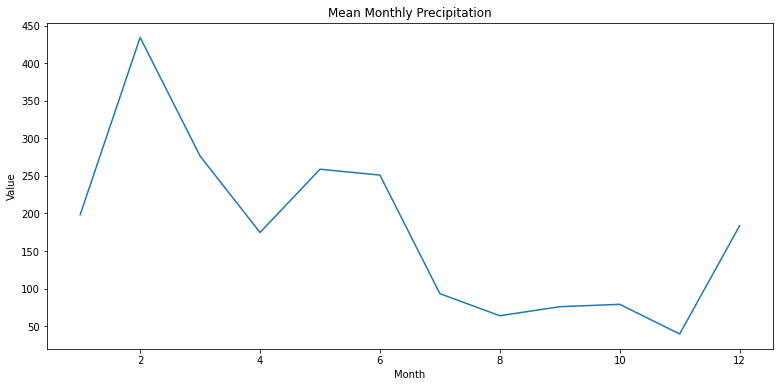

In [8]:
# Change figure size
plt.figure(figsize=(13,6))

# Create cool scatter plot
sns.lineplot(x=mean_monthly['Month'], y=mean_monthly['Value'])

# Give title
title = 'Mean Monthly Precipitation'
plt.title(title)

# Save graph
# plt.savefig(title, dpi=200)
plt.show()

### Mean Annual Precipitation

In [9]:
df['Year'] = df['Date'].apply(lambda x: x.year)
df['Month'] = df['Date'].apply(lambda x: x.month)
mean_annual = df.groupby(['ID', 'Year'])['Value'].sum().reset_index()
mean_annual

,ID,Year,Value
0,US1MOCG0010,2017,304.7
1,US1MOCG0010,2018,915.6
2,US1MOCG0010,2019,908.6


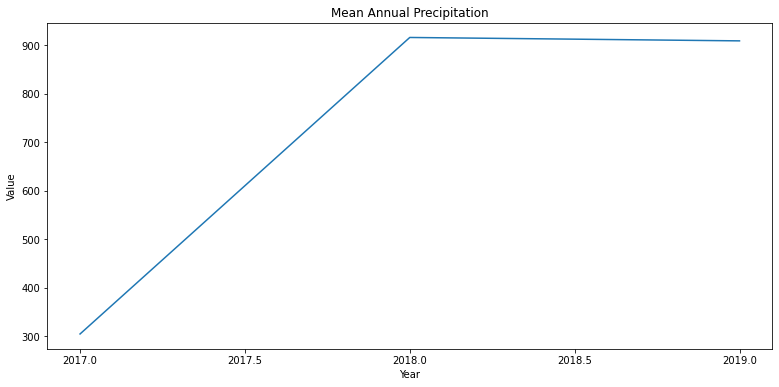

In [15]:
# Change figure size
plt.figure(figsize=(13,6))

# Create cool scatter plot
sns.lineplot(x=mean_annual['Year'], y=mean_annual['Value'])

# limit number of xticks
plt.locator_params(axis='x', nbins=5)

# Give title
title = 'Mean Annual Precipitation'
plt.title(title)

# Save graph
# plt.savefig(title, dpi=200)
plt.show()

### Monthly Precipitation Distribution

In [16]:
df['month_year'] = df['Date'].dt.to_period('M')
monthly_distribution = df.groupby(['ID', 'month_year'])['Value'].sum().reset_index()
monthly_distribution

,ID,month_year,Value
0,US1MOCG0010,2017-07,19.1
1,US1MOCG0010,2017-08,44.0
2,US1MOCG0010,2017-09,75.8
3,US1MOCG0010,2017-10,79.0
4,US1MOCG0010,2017-11,25.7
5,US1MOCG0010,2017-12,61.1
6,US1MOCG0010,2018-01,51.7
7,US1MOCG0010,2018-02,240.7
8,US1MOCG0010,2018-03,157.7
9,US1MOCG0010,2018-04,40.3


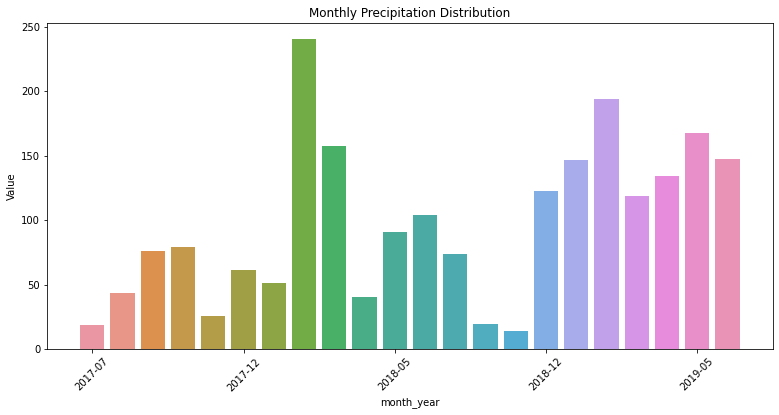

In [17]:
# Change figure size
plt.figure(figsize=(13,6))

# Create cool scatter plot
sns.barplot(x=monthly_distribution['month_year'], y=monthly_distribution['Value'])

# limit number of xticks
plt.locator_params(axis='x', nbins=5)

# Give title
title = 'Monthly Precipitation Distribution'
plt.title(title)

# Rotate x axis labels
plt.xticks(rotation=45)

# Save graph
# plt.savefig(title, dpi=200)
plt.show()

In [18]:
longterm_annual_mean = mean_annual.groupby('ID')['Value'].mean()
longterm_annual_mean

ID
US1MOCG0010    709.633333
Name: Value, dtype: float64

In [19]:
# https://qa.icopy.site/questions/16139306/determine-season-given-timestamp-in-python-using-datetime
def season_of_date(date):
    year = str(date.year)
    seasons = {'spring': pd.date_range(start='21/03/'+year, end='20/06/'+year),
               'summer': pd.date_range(start='21/06/'+year, end='22/09/'+year),
               'autumn': pd.date_range(start='23/09/'+year, end='20/12/'+year)}
    if date in seasons['spring']:
        return f'{year}-spring'
    if date in seasons['summer']:
        return f'{year}-summer'
    if date in seasons['autumn']:
        return f'{year}-autumn'
    else:
        return f'{year}-winter'

df['Season'] = df.Date.map(season_of_date)
seasonal_distribution = df.groupby(['ID', 'Season'])['Value'].sum().reset_index()
seasonal_distribution

,ID,Season,Value
0,US1MOCG0010,2017-autumn,118.8
1,US1MOCG0010,2017-summer,138.9
2,US1MOCG0010,2017-winter,47.0
3,US1MOCG0010,2018-autumn,100.0
4,US1MOCG0010,2018-spring,250.8
5,US1MOCG0010,2018-summer,182.7
6,US1MOCG0010,2018-winter,382.1
7,US1MOCG0010,2019-spring,402.5
8,US1MOCG0010,2019-summer,84.3
9,US1MOCG0010,2019-winter,421.8


In [20]:
longterm_seasonal_mean = seasonal_distribution.groupby('ID')['Value'].mean()
longterm_seasonal_mean

ID
US1MOCG0010    212.89
Name: Value, dtype: float64

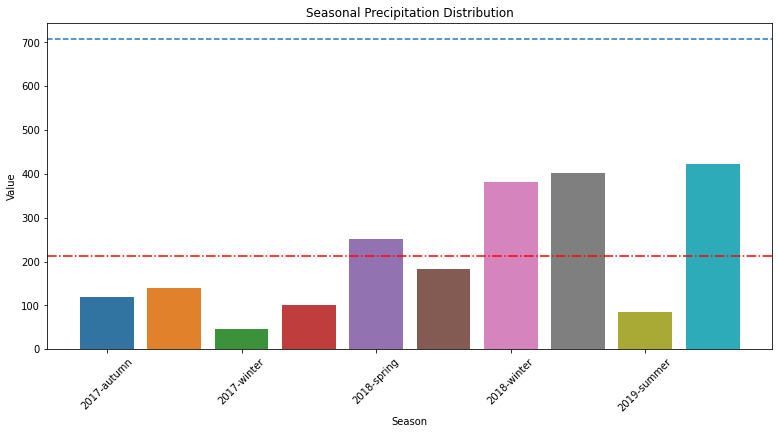

In [21]:
# Change figure size
plt.figure(figsize=(13,6))

# Create cool scatter plot
graph = sns.barplot(x=seasonal_distribution['Season'], y=seasonal_distribution['Value'])

# limit number of xticks
plt.locator_params(axis='x', nbins=5)

# Give title
title = 'Seasonal Precipitation Distribution'
plt.title(title)

# Rotate x axis labels
plt.xticks(rotation=45)

# https://matplotlib.org/3.5.0/gallery/lines_bars_and_markers/linestyles.html
# Long-term Annual mean line
graph.axhline(709,  ls='--')

# Long-term Seasonal mean line
graph.axhline(212,  ls='-.', c='red')

# Save graph
# plt.savefig(title, dpi=200)
plt.show()

## Precipitation Trend

D:\VirtualENV\jupyter_ghcn\lib\site-packages\ipykernel_launcher.py:6: UserWarning: 'set_params()' not defined for locator of type <class 'matplotlib.dates.AutoDateLocator'>
  


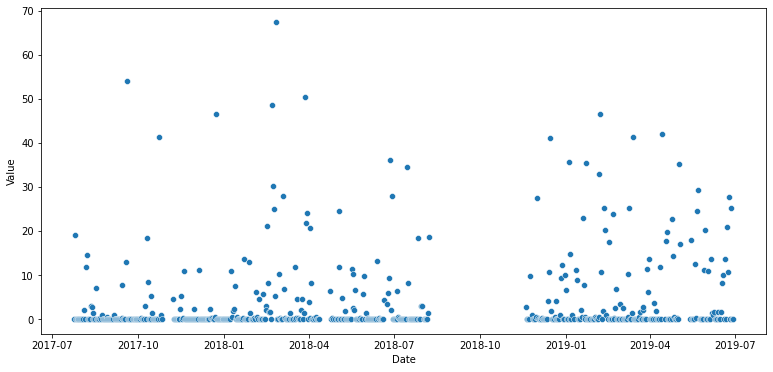

In [22]:
plt.figure(figsize=(13,6))

ax = sns.scatterplot(data=df, x="Date", y="Value")

# limit number of xticks
plt.locator_params(axis='x', nbins=5)

# Save graph
# plt.savefig(title, dpi=200)
plt.show()